## Setup ##

In [1]:
"""Visualize embeddings produced"""
import numpy as np
import tensorflow as tf 
import h5py
import matplotlib.pyplot as plt
import os

from skimage import measure

import utils

%load_ext autoreload
%autoreload 2

os.environ['CUDA_VISIBLE_DEVICES'] = '2'

ROOT = '/usr/people/kluther/Projects/metric_segmentation/'

In [2]:
%%javascript
require(
        ["notebook/js/outputarea"],
        function (oa) {
            oa.OutputArea.auto_scroll_threshold = -1;
            console.log("Setting auto_scroll_threshold to -1");
        });

<IPython.core.display.Javascript object>

In [3]:
"""Load data"""
em_imgs  = h5py.File(os.path.join(ROOT, 'data', 'image.h5'), 'r')['main']
seg_imgs = h5py.File(os.path.join(ROOT, 'data', 'human_labels.h5'), 'r')['main']

em_imgs_train = em_imgs[:192]
seg_imgs_train = seg_imgs[:192]
em_imgs_dev = em_imgs[192:]
seg_imgs_dev = seg_imgs[192:]

## Vector Development ##

INFO:tensorflow:Restoring parameters from /usr/people/kluther/Projects/metric_segmentation/experiments/boundary_mask_on/models/model0.ckpt


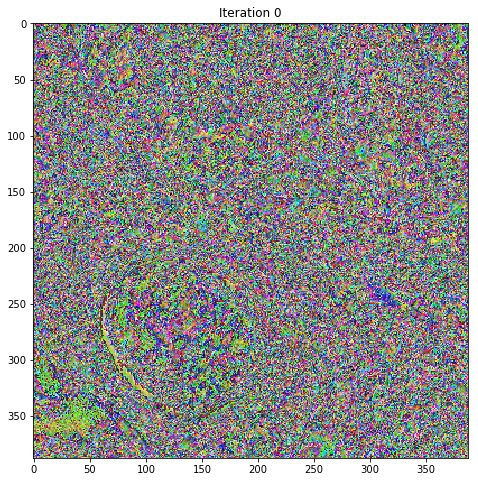

INFO:tensorflow:Restoring parameters from /usr/people/kluther/Projects/metric_segmentation/experiments/boundary_mask_on/models/model2000.ckpt


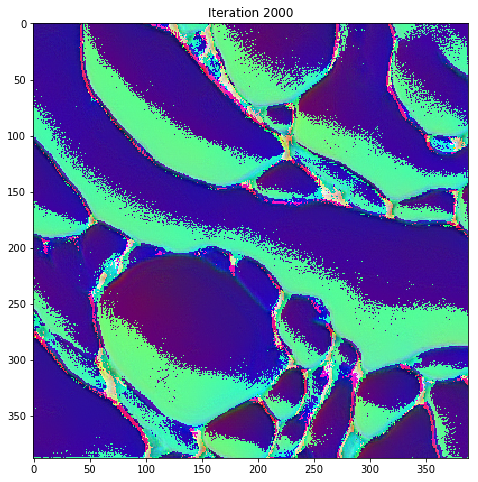

INFO:tensorflow:Restoring parameters from /usr/people/kluther/Projects/metric_segmentation/experiments/boundary_mask_on/models/model4000.ckpt


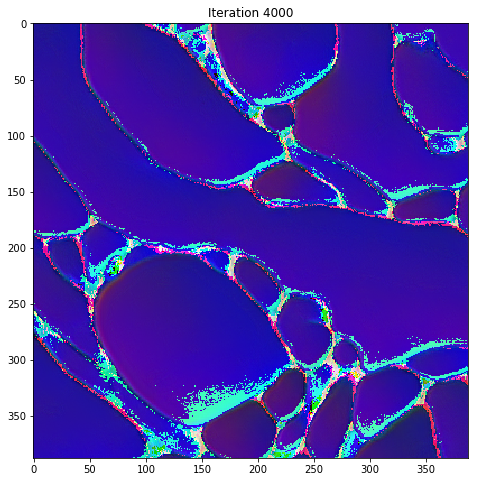

INFO:tensorflow:Restoring parameters from /usr/people/kluther/Projects/metric_segmentation/experiments/boundary_mask_on/models/model6000.ckpt


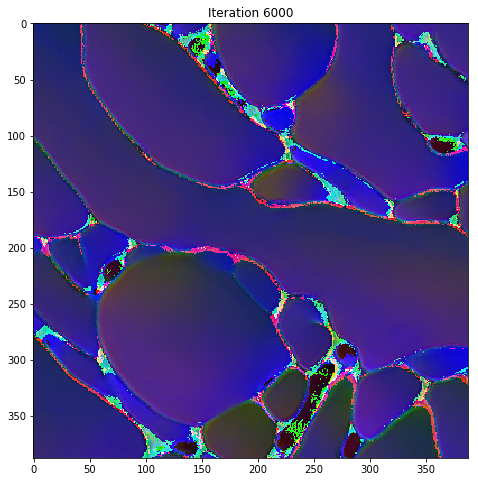

INFO:tensorflow:Restoring parameters from /usr/people/kluther/Projects/metric_segmentation/experiments/boundary_mask_on/models/model8000.ckpt


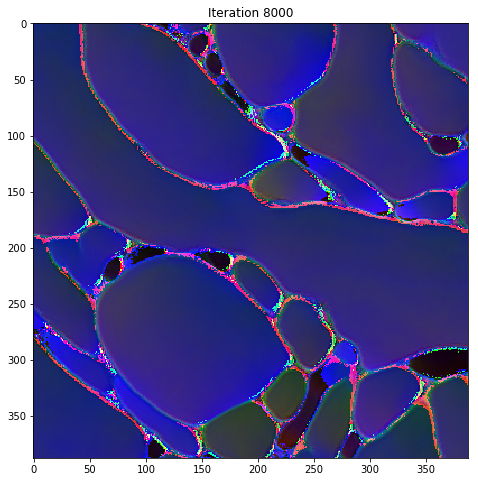

INFO:tensorflow:Restoring parameters from /usr/people/kluther/Projects/metric_segmentation/experiments/boundary_mask_on/models/model10000.ckpt


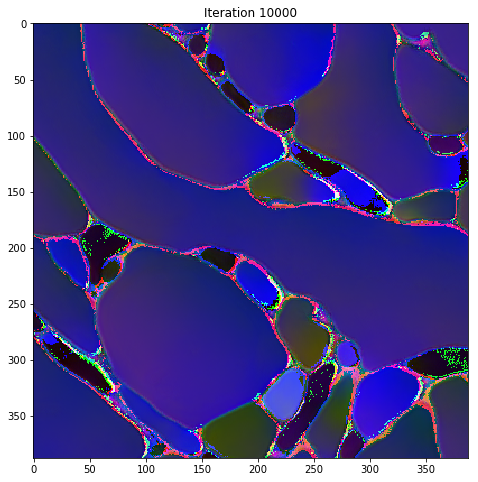

INFO:tensorflow:Restoring parameters from /usr/people/kluther/Projects/metric_segmentation/experiments/boundary_mask_on/models/model12000.ckpt


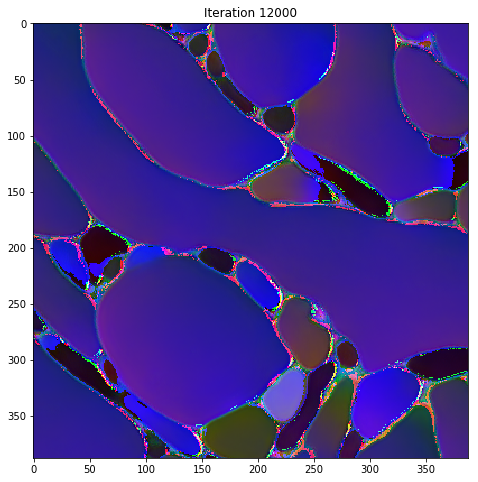

INFO:tensorflow:Restoring parameters from /usr/people/kluther/Projects/metric_segmentation/experiments/boundary_mask_on/models/model14000.ckpt


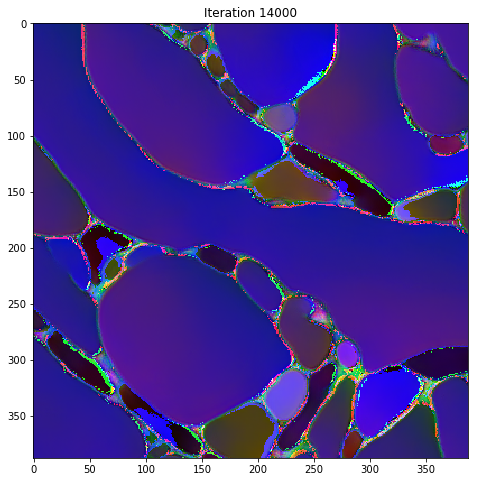

INFO:tensorflow:Restoring parameters from /usr/people/kluther/Projects/metric_segmentation/experiments/boundary_mask_on/models/model16000.ckpt


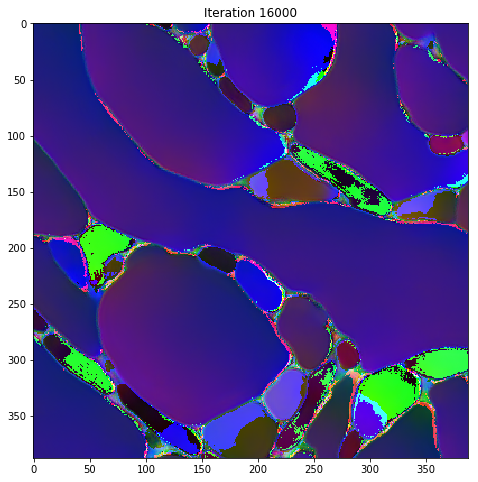

INFO:tensorflow:Restoring parameters from /usr/people/kluther/Projects/metric_segmentation/experiments/boundary_mask_on/models/model18000.ckpt


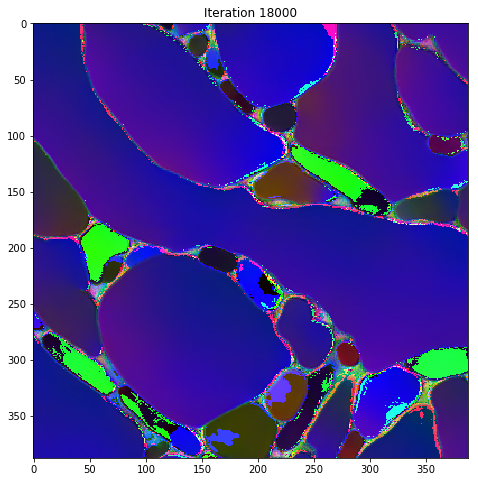

INFO:tensorflow:Restoring parameters from /usr/people/kluther/Projects/metric_segmentation/experiments/boundary_mask_on/models/model20000.ckpt


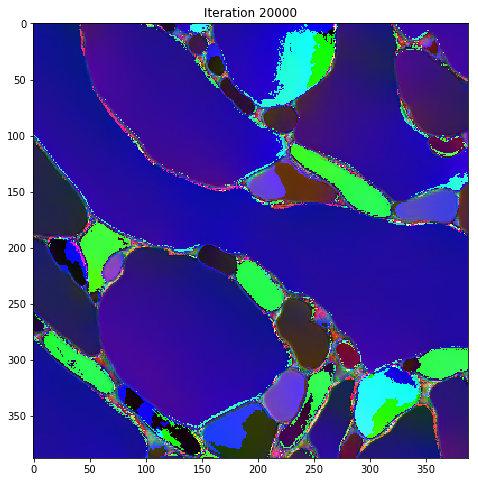

INFO:tensorflow:Restoring parameters from /usr/people/kluther/Projects/metric_segmentation/experiments/boundary_mask_on/models/model22000.ckpt


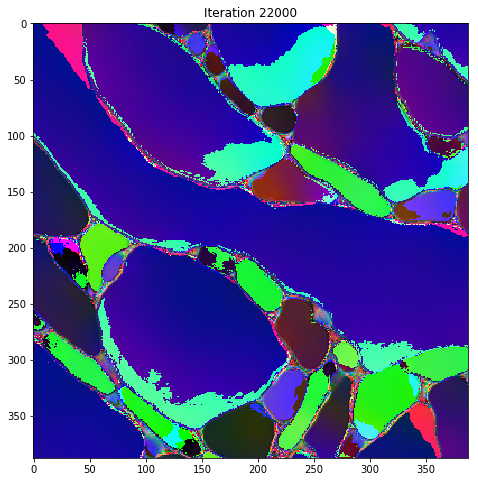

INFO:tensorflow:Restoring parameters from /usr/people/kluther/Projects/metric_segmentation/experiments/boundary_mask_on/models/model24000.ckpt


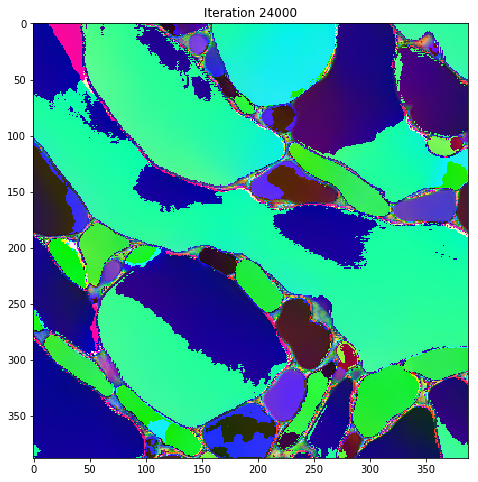

INFO:tensorflow:Restoring parameters from /usr/people/kluther/Projects/metric_segmentation/experiments/boundary_mask_on/models/model26000.ckpt


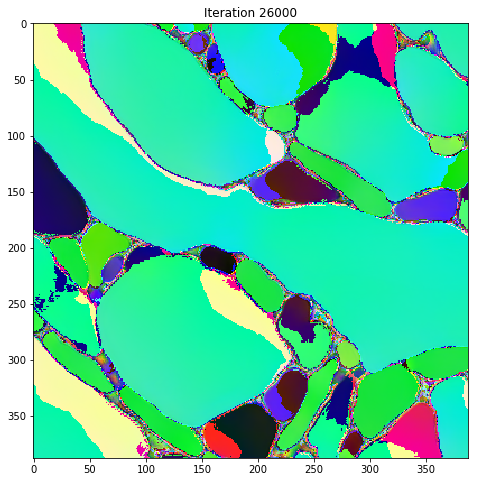

INFO:tensorflow:Restoring parameters from /usr/people/kluther/Projects/metric_segmentation/experiments/boundary_mask_on/models/model28000.ckpt


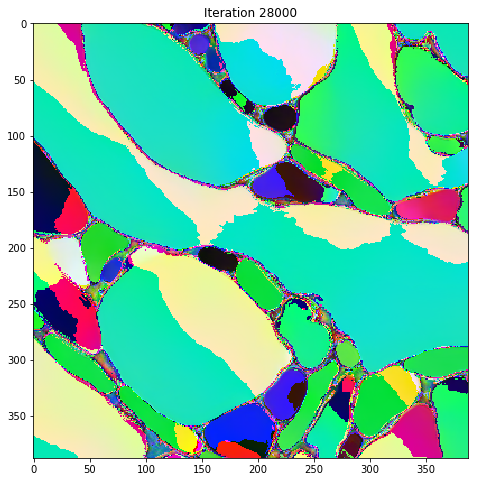

INFO:tensorflow:Restoring parameters from /usr/people/kluther/Projects/metric_segmentation/experiments/boundary_mask_on/models/model30000.ckpt


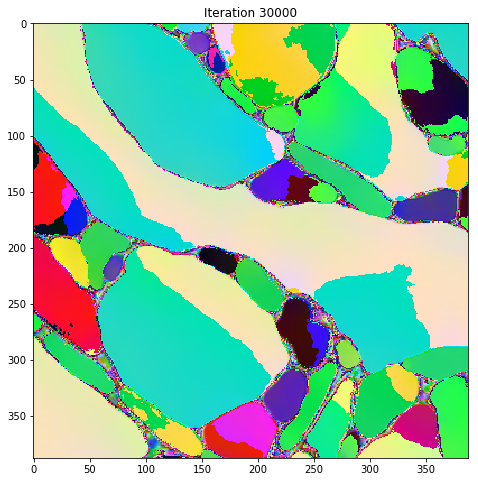

INFO:tensorflow:Restoring parameters from /usr/people/kluther/Projects/metric_segmentation/experiments/boundary_mask_on/models/model32000.ckpt


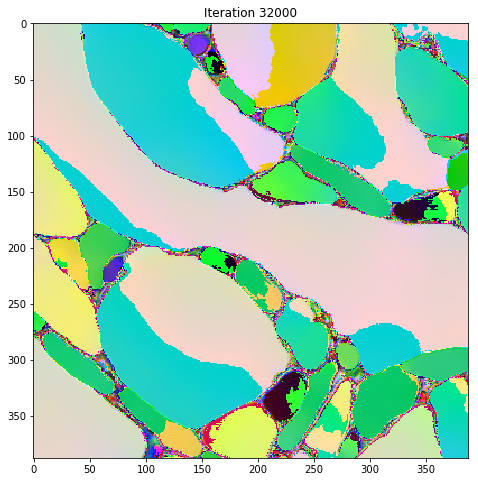

INFO:tensorflow:Restoring parameters from /usr/people/kluther/Projects/metric_segmentation/experiments/boundary_mask_on/models/model34000.ckpt


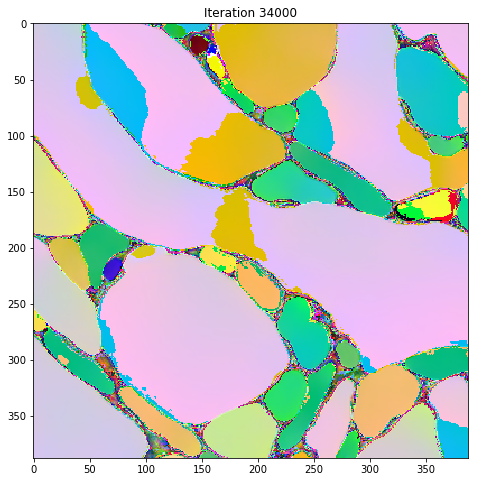

INFO:tensorflow:Restoring parameters from /usr/people/kluther/Projects/metric_segmentation/experiments/boundary_mask_on/models/model36000.ckpt


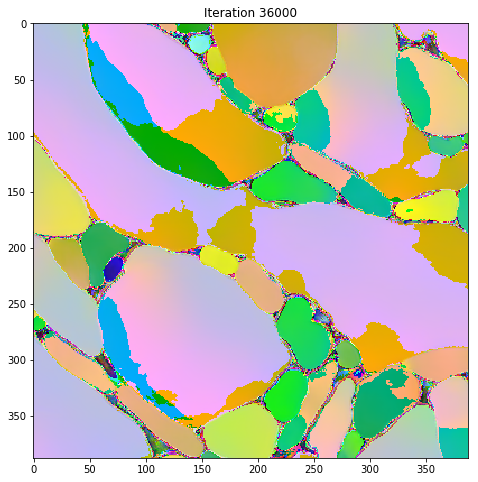

INFO:tensorflow:Restoring parameters from /usr/people/kluther/Projects/metric_segmentation/experiments/boundary_mask_on/models/model38000.ckpt


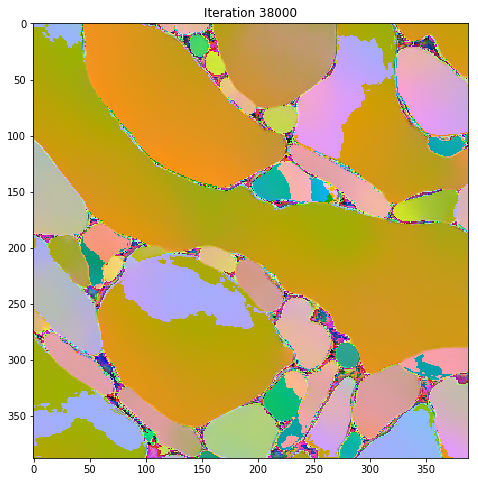

INFO:tensorflow:Restoring parameters from /usr/people/kluther/Projects/metric_segmentation/experiments/boundary_mask_on/models/model40000.ckpt


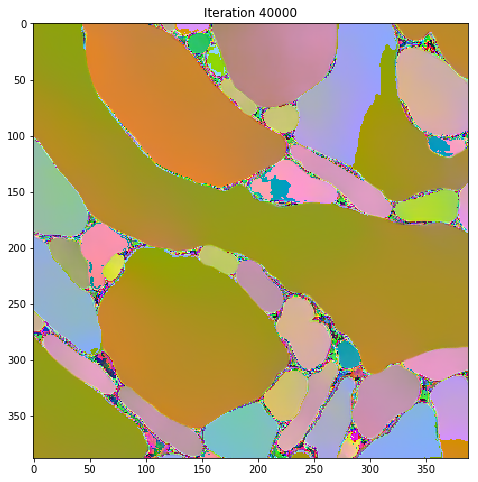

INFO:tensorflow:Restoring parameters from /usr/people/kluther/Projects/metric_segmentation/experiments/boundary_mask_on/models/model42000.ckpt


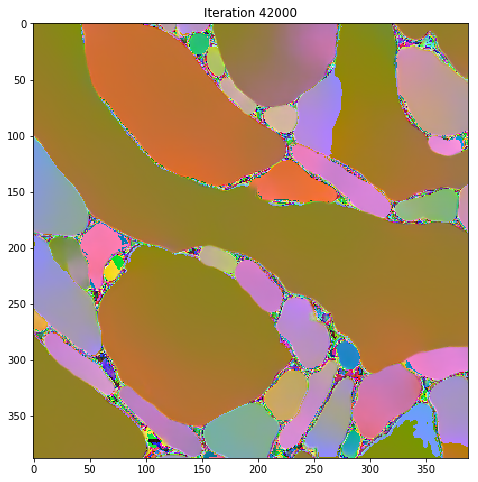

INFO:tensorflow:Restoring parameters from /usr/people/kluther/Projects/metric_segmentation/experiments/boundary_mask_on/models/model44000.ckpt


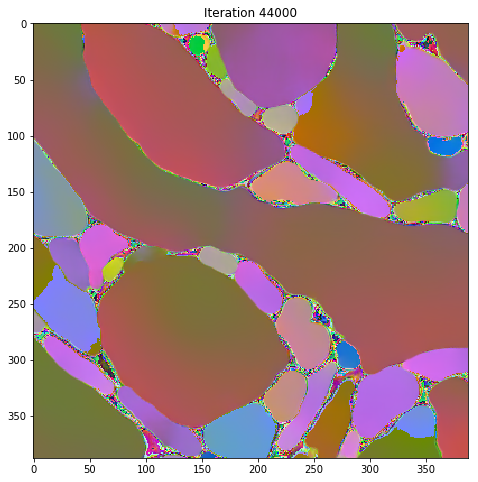

INFO:tensorflow:Restoring parameters from /usr/people/kluther/Projects/metric_segmentation/experiments/boundary_mask_on/models/model46000.ckpt


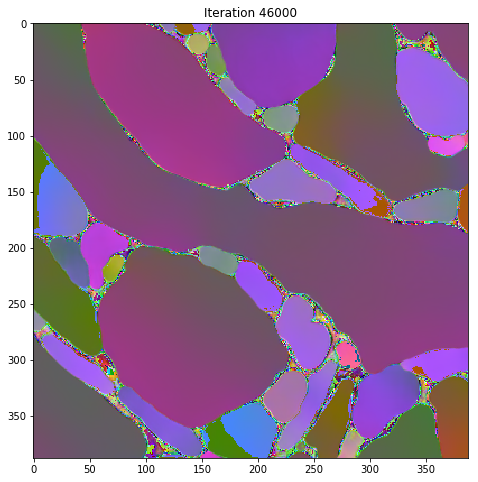

INFO:tensorflow:Restoring parameters from /usr/people/kluther/Projects/metric_segmentation/experiments/boundary_mask_on/models/model48000.ckpt


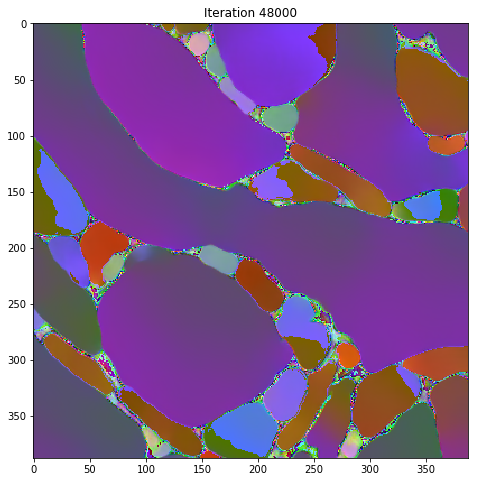

INFO:tensorflow:Restoring parameters from /usr/people/kluther/Projects/metric_segmentation/experiments/boundary_mask_on/models/model50000.ckpt


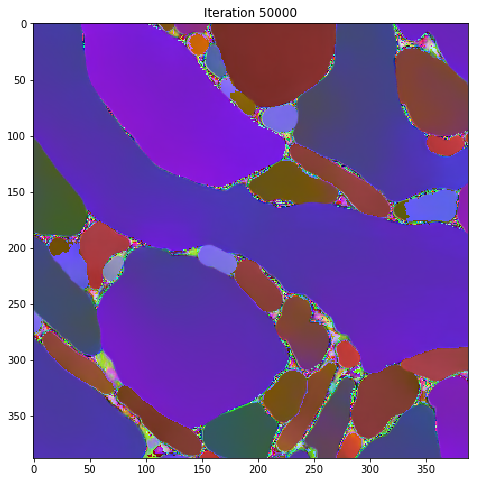

INFO:tensorflow:Restoring parameters from /usr/people/kluther/Projects/metric_segmentation/experiments/boundary_mask_on/models/model52000.ckpt


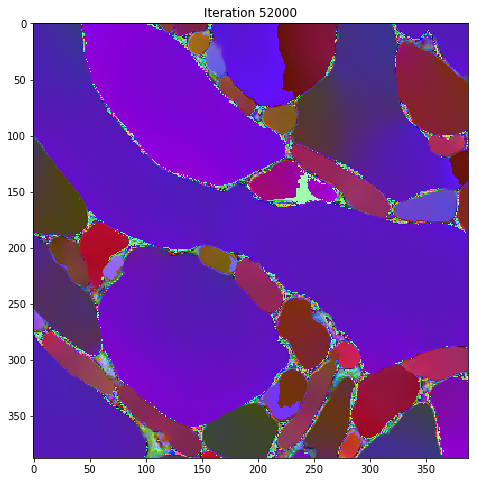

INFO:tensorflow:Restoring parameters from /usr/people/kluther/Projects/metric_segmentation/experiments/boundary_mask_on/models/model54000.ckpt


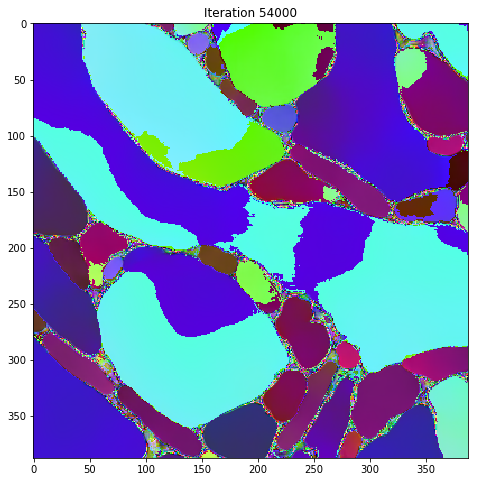

INFO:tensorflow:Restoring parameters from /usr/people/kluther/Projects/metric_segmentation/experiments/boundary_mask_on/models/model56000.ckpt


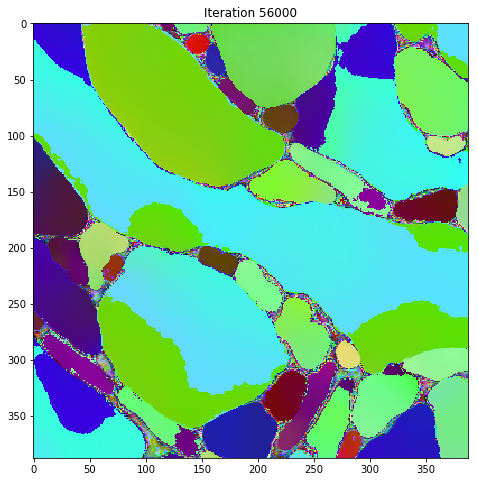

INFO:tensorflow:Restoring parameters from /usr/people/kluther/Projects/metric_segmentation/experiments/boundary_mask_on/models/model58000.ckpt


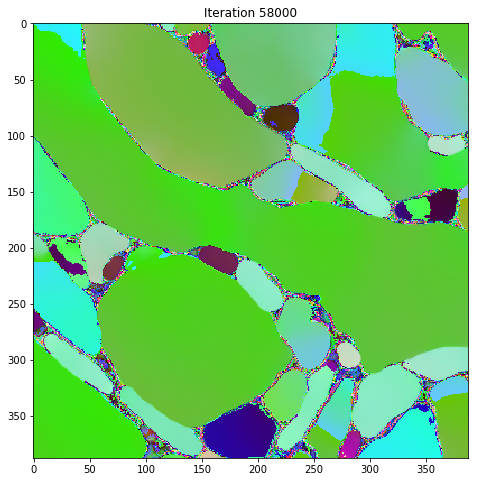

INFO:tensorflow:Restoring parameters from /usr/people/kluther/Projects/metric_segmentation/experiments/boundary_mask_on/models/model60000.ckpt


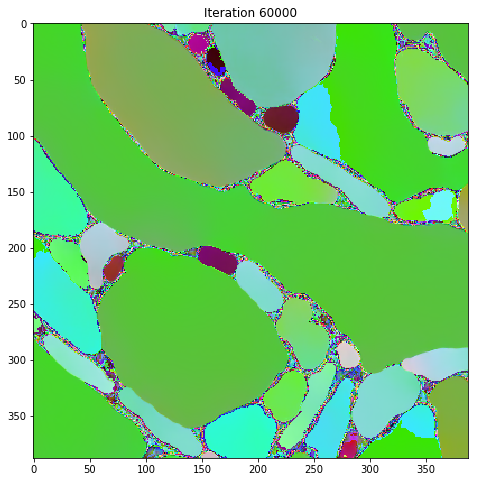

INFO:tensorflow:Restoring parameters from /usr/people/kluther/Projects/metric_segmentation/experiments/boundary_mask_on/models/model62000.ckpt


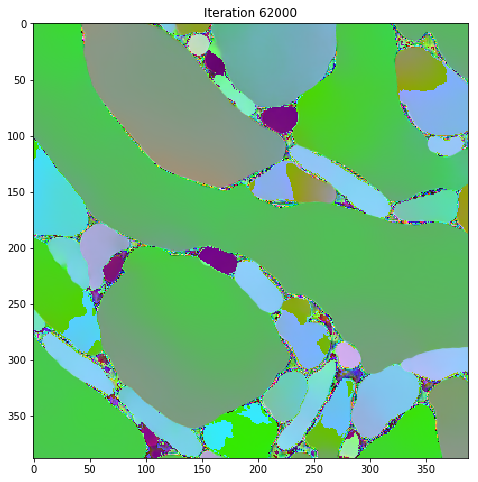

INFO:tensorflow:Restoring parameters from /usr/people/kluther/Projects/metric_segmentation/experiments/boundary_mask_on/models/model64000.ckpt


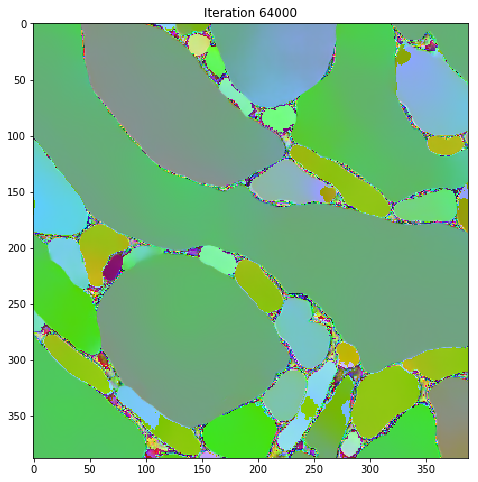

INFO:tensorflow:Restoring parameters from /usr/people/kluther/Projects/metric_segmentation/experiments/boundary_mask_on/models/model66000.ckpt


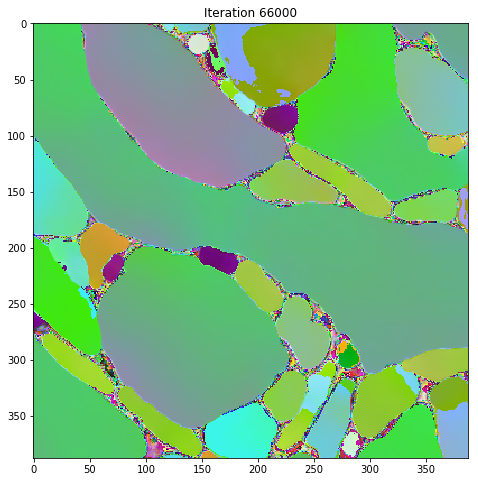

INFO:tensorflow:Restoring parameters from /usr/people/kluther/Projects/metric_segmentation/experiments/boundary_mask_on/models/model68000.ckpt


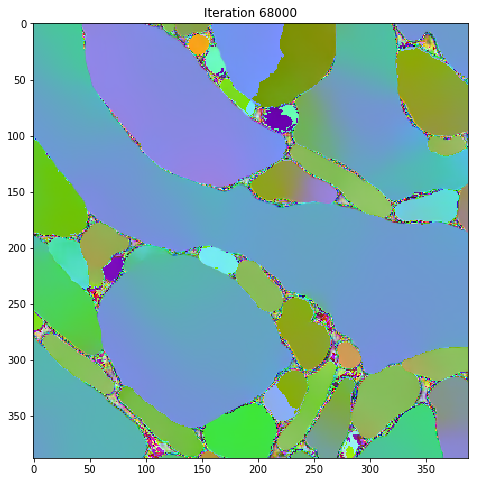

INFO:tensorflow:Restoring parameters from /usr/people/kluther/Projects/metric_segmentation/experiments/boundary_mask_on/models/model70000.ckpt


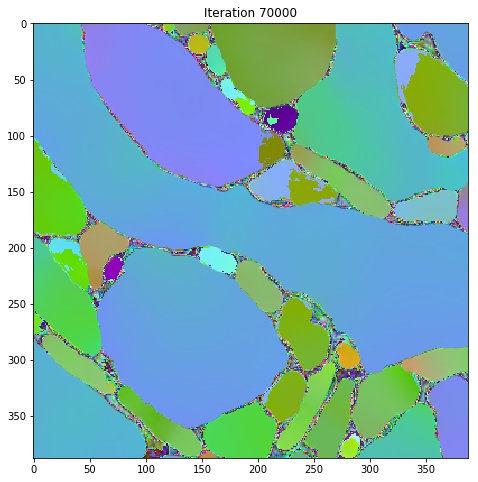

INFO:tensorflow:Restoring parameters from /usr/people/kluther/Projects/metric_segmentation/experiments/boundary_mask_on/models/model72000.ckpt


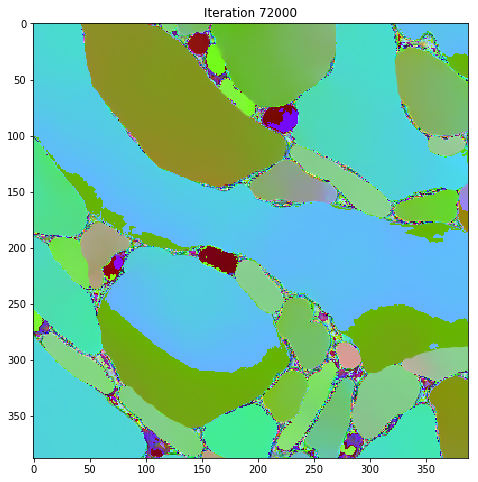

INFO:tensorflow:Restoring parameters from /usr/people/kluther/Projects/metric_segmentation/experiments/boundary_mask_on/models/model74000.ckpt


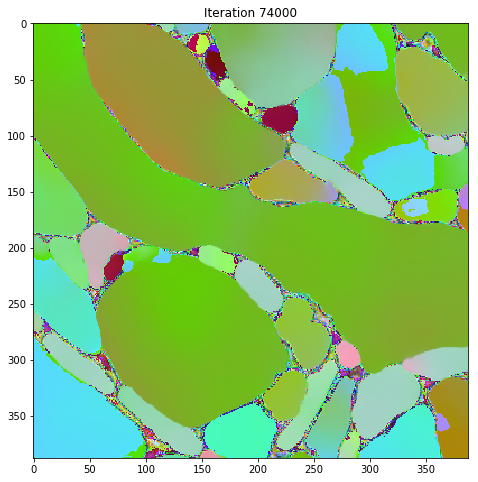

INFO:tensorflow:Restoring parameters from /usr/people/kluther/Projects/metric_segmentation/experiments/boundary_mask_on/models/model76000.ckpt


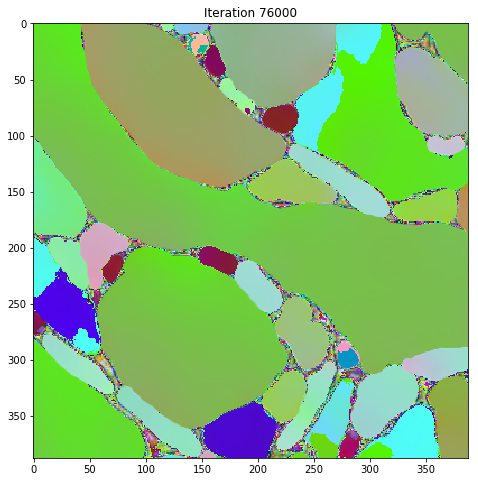

INFO:tensorflow:Restoring parameters from /usr/people/kluther/Projects/metric_segmentation/experiments/boundary_mask_on/models/model78000.ckpt


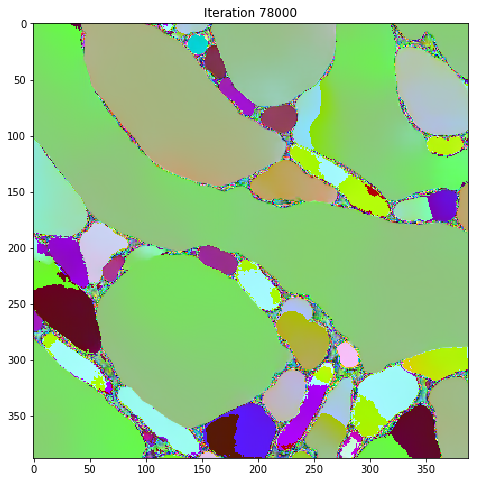

INFO:tensorflow:Restoring parameters from /usr/people/kluther/Projects/metric_segmentation/experiments/boundary_mask_on/models/model80000.ckpt


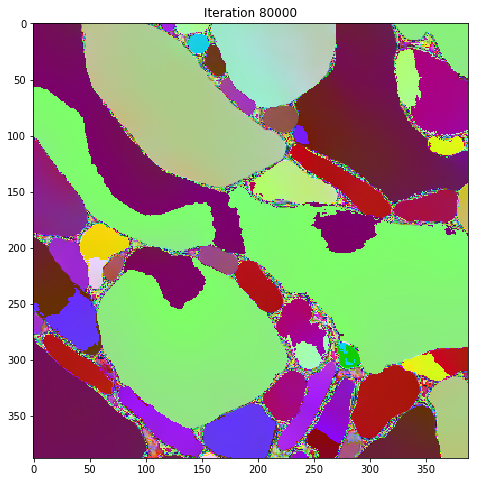

INFO:tensorflow:Restoring parameters from /usr/people/kluther/Projects/metric_segmentation/experiments/boundary_mask_on/models/model82000.ckpt


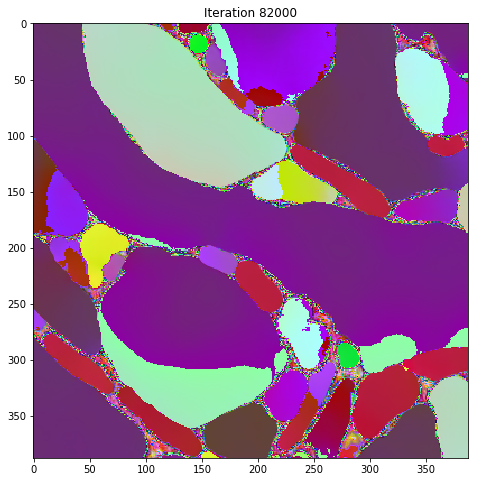

INFO:tensorflow:Restoring parameters from /usr/people/kluther/Projects/metric_segmentation/experiments/boundary_mask_on/models/model84000.ckpt


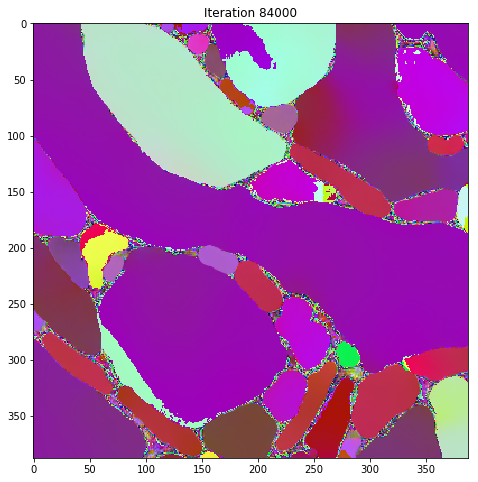

INFO:tensorflow:Restoring parameters from /usr/people/kluther/Projects/metric_segmentation/experiments/boundary_mask_on/models/model86000.ckpt


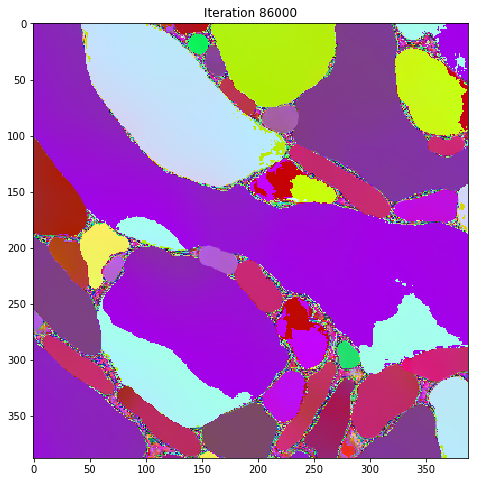

INFO:tensorflow:Restoring parameters from /usr/people/kluther/Projects/metric_segmentation/experiments/boundary_mask_on/models/model88000.ckpt


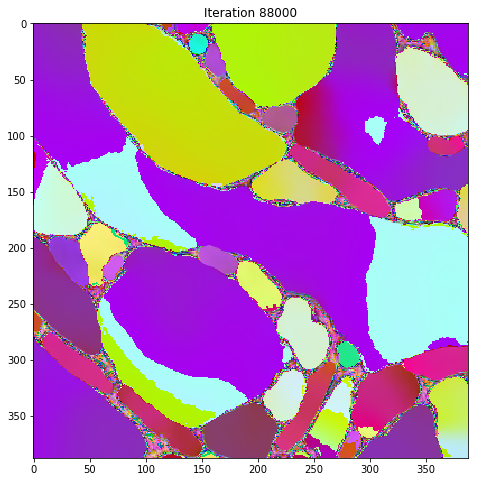

INFO:tensorflow:Restoring parameters from /usr/people/kluther/Projects/metric_segmentation/experiments/boundary_mask_on/models/model90000.ckpt


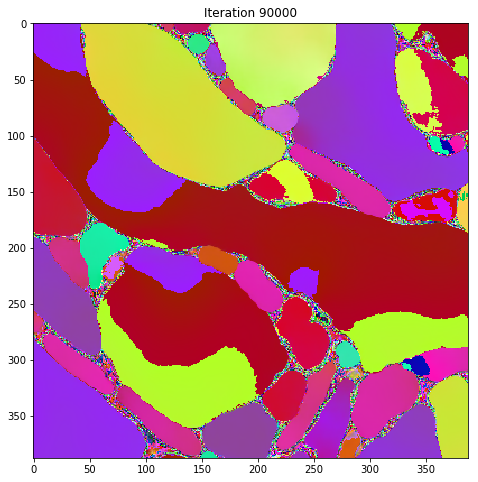

INFO:tensorflow:Restoring parameters from /usr/people/kluther/Projects/metric_segmentation/experiments/boundary_mask_on/models/model92000.ckpt


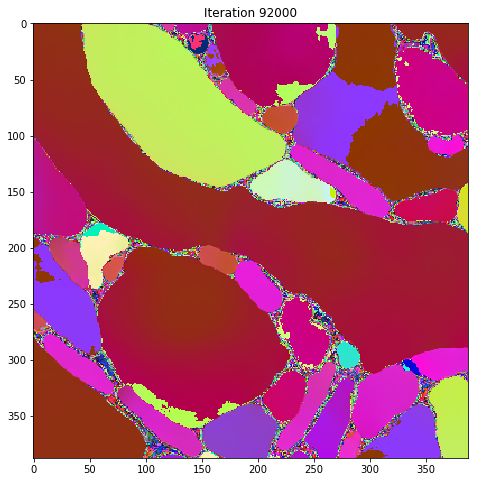

INFO:tensorflow:Restoring parameters from /usr/people/kluther/Projects/metric_segmentation/experiments/boundary_mask_on/models/model94000.ckpt


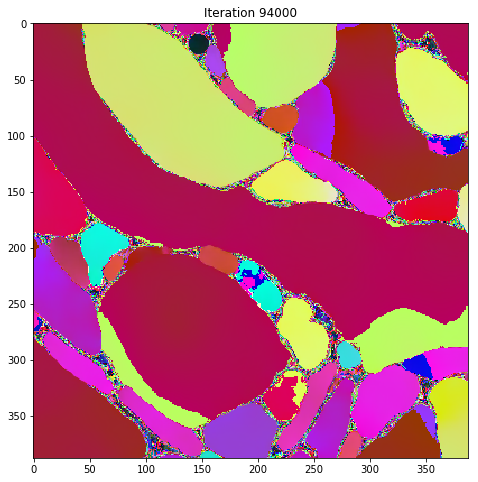

INFO:tensorflow:Restoring parameters from /usr/people/kluther/Projects/metric_segmentation/experiments/boundary_mask_on/models/model96000.ckpt


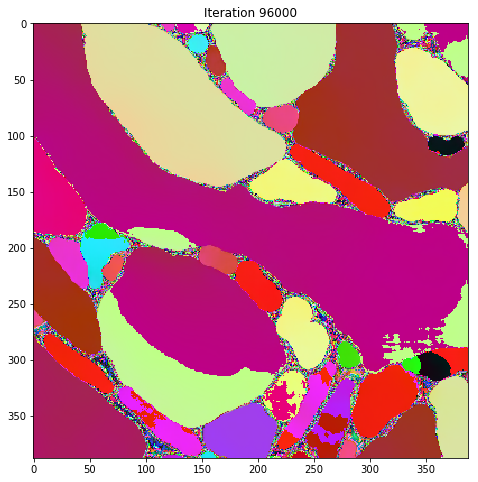

INFO:tensorflow:Restoring parameters from /usr/people/kluther/Projects/metric_segmentation/experiments/boundary_mask_on/models/model98000.ckpt


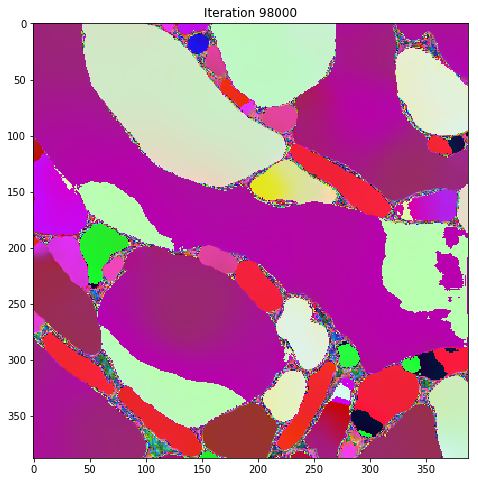

In [4]:
# Setup
EXP_NAME = 'boundary_mask_on'
#tf.reset_default_graph()
sess = tf.Session()

# Image
em_img = em_imgs_train[0,:572,:572]

# Run
iterations = list(range(0,100000, 2000))
for i in iterations:
    # load model
    model_name = os.path.join(ROOT, 'experiments', EXP_NAME, 'models', 'model{}.ckpt'.format(i))
    #tf.reset_default_graph()
    inputs, outputs = utils.load_model(model_name, sess)
    
    # generate vectors 
    vecs = utils.generate_vector_labels(inputs, outputs, em_img, sess)
    rgb = vecs[:,:,0:3]
    
    # plot
    plt.figure(figsize=(8,8))
    plt.title('Iteration {}'.format(i))
    plt.imshow(rgb); plt.show()
    
